In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import phik
    
import warnings
warnings.filterwarnings('ignore')

#pandas DataFrame column and row display limits
#pd.set_option('max_columns', None)
#pd.set_option('max_rows', None)

from datetime import datetime
import gc

In [1]:
curr=pd.read_csv("application_train.csv") #current applications
prev=pd.read_csv("previous_application.csv")
bureau=pd.read_csv("bureau.csv")#previous applications to check if anyone has applied before
bureau_bal=pd.read_csv("bureau_balance.csv")
credit=pd.read_csv("credit_card_balance.csv")
install=pd.read_csv("installments_payments.csv")
pos=pd.read_csv("POS_CASH_balance.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Creating features from Bureau Balance

In [18]:
df=bureau_bal.loc[bureau_bal['STATUS']=="C"]

In [20]:
bureau_baldf.replace("C","ALphabet",regex=True)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,ALphabet
1,5715448,-1,ALphabet
2,5715448,-2,ALphabet
3,5715448,-3,ALphabet
4,5715448,-4,ALphabet
...,...,...,...
27299863,5041172,-64,ALphabet
27299864,5041172,-65,ALphabet
27299865,5041172,-66,ALphabet
27299866,5041172,-67,ALphabet


In [4]:
bureau_bal.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [5]:
bureau_bal.shape

(27299925, 3)

In [7]:
# get bureau_status features by creating a crosstab
# get count of 0, 1, 2, 3, 4, 5, C, X by SK_ID_BUREAU

bb_status=pd.crosstab(bureau_bal.SK_ID_BUREAU,bureau_bal.STATUS,margins=True)
bb_status.head(2)

STATUS,0,1,2,3,4,5,C,X,All
SK_ID_BUREAU,,,,,,,,,
5001709,0,0,0,0,0,0,86,11,97
5001710,5,0,0,0,0,0,48,30,83


In [8]:
bureau_bal["MONTHS_BALANCE"].value_counts()

-1     622601
-2     619243
-3     615080
 0     610965
-4     609138
        ...  
-92     57300
-93     53535
-94     49965
-95     46542
-96     43147
Name: MONTHS_BALANCE, Length: 97, dtype: int64

In [9]:
bureau_bal["MONTHS_BALANCE"]=np.abs(bureau_bal["MONTHS_BALANCE"])

In [10]:
# 96 months , i.e 8 yeras lets convert to years

bureau_bal["MONTHS_BALANCE"]=bureau_bal["MONTHS_BALANCE"]//12

In [11]:
bb_month=pd.crosstab(bureau_bal.SK_ID_BUREAU,bureau_bal.MONTHS_BALANCE,margins=True)

In [12]:
bb_month.head()

MONTHS_BALANCE,0,1,2,3,4,5,6,7,8,All
SK_ID_BUREAU,,,,,,,,,,
5001709,12,12,12,12,12,12,12,12,1,97
5001710,12,12,12,12,12,12,11,0,0,83
5001711,4,0,0,0,0,0,0,0,0,4
5001712,12,7,0,0,0,0,0,0,0,19
5001713,12,10,0,0,0,0,0,0,0,22


In [13]:
bb_status.columns=["BB_"+ columns for columns in bb_status.columns]
print(bb_status.shape,"- Shape of bb_status")

(817396, 9) - Shape of bb_status


In [14]:
bureau_bal.shape

(27299925, 3)

In [40]:
## Merging bb_sdtatus with bureau table on SK_ID_BUREAU

# bureau_balance only has SK_ID_BUREAU key field, so the only thing we can link 
#it to is bureau.csv

bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,0.0,0,91323.0,0.0,0.0,0.0,Consumer credit,-131,0.0
1,215354,5714463,Active,currency 1,-208,0,1075.0,-897.0,0.0,0,225000.0,171342.0,0.0,0.0,Credit card,-20,0.0
2,215354,5714464,Active,currency 1,-203,0,528.0,-897.0,0.0,0,464323.5,0.0,0.0,0.0,Consumer credit,-16,0.0
3,215354,5714465,Active,currency 1,-203,0,-330.0,-897.0,0.0,0,90000.0,0.0,0.0,0.0,Credit card,-16,0.0
4,215354,5714466,Active,currency 1,-629,0,1197.0,-897.0,77674.5,0,2700000.0,0.0,0.0,0.0,Consumer credit,-21,0.0


In [41]:
bureau.columns

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')

In [42]:
bureau.shape

(1716428, 17)

In [15]:
# merge the tables

bureau=bureau.merge(bb_status,left_on="SK_ID_BUREAU",right_on="SK_ID_BUREAU")

In [16]:
bureau=bureau.merge(bb_month,left_on="SK_ID_BUREAU",right_on="SK_ID_BUREAU")

In [17]:
bureau.head(2)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,...,0,1,2,3,4,5,6,7,8,All
0,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,...,12,12,3,0,0,0,0,0,0,27
1,380361,5715449,Active,currency 1,-357,0,1119.0,NaN,NaN,0,...,12,0,0,0,0,0,0,0,0,12


In [18]:
print(bureau.shape,"_ Shape of Bureau Table after merging")

(774354, 36) _ Shape of Bureau Table after merging


In [19]:
bureau.rename(columns={0:"BB_months_0",
                      1:"BB_months_1",
                      2:"BB_months_2",
                      3:"BB_months_3",
                      4:"BB_months_4",
                      5:"BB_months_5",
                      6:"BB_months_6",
                      7:"BB_months_7",
                      8:"BB_months_8",
                      "All":"BB_months_All"},inplace=True)

In [20]:
bureau.head(2)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,...,BB_months_0,BB_months_1,BB_months_2,BB_months_3,BB_months_4,BB_months_5,BB_months_6,BB_months_7,BB_months_8,BB_months_All
0,380361,5715448,Active,currency 1,-820,0,31069.0,NaN,NaN,0,...,12,12,3,0,0,0,0,0,0,27
1,380361,5715449,Active,currency 1,-357,0,1119.0,NaN,NaN,0,...,12,0,0,0,0,0,0,0,0,12


In [21]:
bureau.drop('SK_ID_BUREAU', axis = 1,inplace=True)

In [22]:
bureau.shape

(774354, 35)

In [23]:
# BU_ prefix identifies features that came from bureau

bureau.columns=["BU_"+ columns if columns !="SK_ID_CURR" else columns for columns in bureau.columns]
bureau.head(3)

,SK_ID_CURR,BU_CREDIT_ACTIVE,BU_CREDIT_CURRENCY,BU_DAYS_CREDIT,BU_CREDIT_DAY_OVERDUE,BU_DAYS_CREDIT_ENDDATE,BU_DAYS_ENDDATE_FACT,BU_AMT_CREDIT_MAX_OVERDUE,BU_CNT_CREDIT_PROLONG,BU_AMT_CREDIT_SUM,...,BU_BB_months_0,BU_BB_months_1,BU_BB_months_2,BU_BB_months_3,BU_BB_months_4,BU_BB_months_5,BU_BB_months_6,BU_BB_months_7,BU_BB_months_8,BU_BB_months_All
0,380361,Active,currency 1,-820,0,31069.0,NaN,NaN,0,67500.0,...,12,12,3,0,0,0,0,0,0,27
1,380361,Active,currency 1,-357,0,1119.0,NaN,NaN,0,45000.0,...,12,0,0,0,0,0,0,0,0,12
2,380361,Closed,currency 1,-917,0,-187.0,-759.0,NaN,0,74439.0,...,7,12,7,0,0,0,0,0,0,26


In [24]:
# Create numeric features by grouping on SK_ID_CURR and finding group means

bureau_num=bureau.groupby(by=["SK_ID_CURR"]).mean().reset_index()
print(bureau_num.shape, "- shape of numeric bureau features (incl index)")  

(134542, 32) - shape of numeric bureau features (incl index)


In [27]:
bureau_num.head()

,SK_ID_CURR,BU_DAYS_CREDIT,BU_CREDIT_DAY_OVERDUE,BU_DAYS_CREDIT_ENDDATE,BU_DAYS_ENDDATE_FACT,BU_AMT_CREDIT_MAX_OVERDUE,BU_CNT_CREDIT_PROLONG,BU_AMT_CREDIT_SUM,BU_AMT_CREDIT_SUM_DEBT,BU_AMT_CREDIT_SUM_LIMIT,...,BU_BB_months_0,BU_BB_months_1,BU_BB_months_2,BU_BB_months_3,BU_BB_months_4,BU_BB_months_5,BU_BB_months_6,BU_BB_months_7,BU_BB_months_8,BU_BB_months_All
0,100001,-735.000000,0.0,82.428571,-825.50,NaN,0.0,207623.571429,85240.928571,0.00000,...,10.428571,7.857143,4.00,1.714286,0.571429,0.00,0.0,0.0,0.0,24.571429
1,100002,-874.000000,0.0,-349.000000,-697.50,1681.029,0.0,108131.945625,49156.200000,7997.14125,...,2.000000,3.750000,6.25,1.750000,0.000000,0.00,0.0,0.0,0.0,13.750000
2,100005,-190.666667,0.0,439.333333,-123.00,0.000,0.0,219042.000000,189469.500000,0.00000,...,6.666667,0.333333,0.00,0.000000,0.000000,0.00,0.0,0.0,0.0,7.000000
3,100010,-1939.500000,0.0,-119.500000,-1138.00,NaN,0.0,495000.000000,174003.750000,0.00000,...,5.000000,6.000000,6.00,1.000000,2.500000,6.00,6.0,3.5,0.0,36.000000
4,100013,-1737.500000,0.0,-1068.000000,-1054.75,19305.000,0.0,518070.015000,0.000000,NaN,...,12.000000,12.000000,12.00,10.000000,7.750000,3.75,0.0,0.0,0.0,57.500000


In [25]:
# Create categorical features by creating dummies and then taking group means

bureau_cat = pd.get_dummies(bureau.select_dtypes('object'))
print(bureau_cat.shape, "- shape of categorical bureau features (incl index)")

(774354, 22) - shape of categorical bureau features (incl index)


In [26]:
bureau_cat.head()

,BU_CREDIT_ACTIVE_Active,BU_CREDIT_ACTIVE_Bad debt,BU_CREDIT_ACTIVE_Closed,BU_CREDIT_ACTIVE_Sold,BU_CREDIT_CURRENCY_currency 1,BU_CREDIT_CURRENCY_currency 2,BU_CREDIT_CURRENCY_currency 3,BU_CREDIT_CURRENCY_currency 4,BU_CREDIT_TYPE_Another type of loan,BU_CREDIT_TYPE_Car loan,...,BU_CREDIT_TYPE_Credit card,BU_CREDIT_TYPE_Loan for business development,BU_CREDIT_TYPE_Loan for purchase of shares (margin lending),BU_CREDIT_TYPE_Loan for the purchase of equipment,BU_CREDIT_TYPE_Loan for working capital replenishment,BU_CREDIT_TYPE_Microloan,BU_CREDIT_TYPE_Mobile operator loan,BU_CREDIT_TYPE_Mortgage,BU_CREDIT_TYPE_Real estate loan,BU_CREDIT_TYPE_Unknown type of loan
0,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [29]:
bureau_cat['SK_ID_CURR'] = bureau['SK_ID_CURR'] 

In [30]:
print(bureau_cat.shape, "- shape of categorical bureau features (incl index)")

(774354, 23) - shape of categorical bureau features (incl index)


In [31]:
# Number of past loans per customer (just one feature)

bureau_credit_count=bureau.groupby('SK_ID_CURR')["BU_CREDIT_ACTIVE"].count().reset_index()

In [33]:
bureau_credit_count.tail(20)

,SK_ID_CURR,BU_CREDIT_ACTIVE
134522,456218,14
134523,456219,8
134524,456221,5
134525,456223,5
134526,456224,17
134527,456225,9
134528,456226,2
134529,456230,12
134530,456231,7
134531,456233,1


In [34]:
bureau_credit_count.rename(columns={"BU_CREDIT_ACTIVE":"BUREAU_CREDIT_COUNT"},inplace=True)

#### Merge our new features into Current application on SK_ID_CURR

In [35]:
curr.shape

(307511, 122)

In [36]:
# merging numerical features of bureau on current applications

curr=curr.merge(bureau_num,on='SK_ID_CURR',how="left")

In [37]:
# merging categorical features of bureau on current applications

curr=curr.merge(bureau_cat,on='SK_ID_CURR',how="left")

In [38]:
# merging bureau credit count features of bureau on current applications

curr=curr.merge(bureau_credit_count,on='SK_ID_CURR',how="left")

In [39]:
print(curr.shape, "- shape of Current Application after merges with bureau features")

(738795, 176) - shape of Current Application after merges with bureau features


In [63]:
curr.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BU_DAYS_CREDIT,BU_CREDIT_DAY_OVERDUE,BU_DAYS_CREDIT_ENDDATE,BU_DAYS_ENDDATE_FACT,BU_AMT_CREDIT_MAX_OVERDUE,BU_CNT_CREDIT_PROLONG,BU_AMT_CREDIT_SUM,BU_AMT_CREDIT_SUM_DEBT,BU_AMT_CREDIT_SUM_LIMIT,BU_AMT_CREDIT_SUM_OVERDUE,BU_DAYS_CREDIT_UPDATE,BU_AMT_ANNUITY,BU_BB_0,BU_BB_1,BU_BB_2,BU_BB_3,BU_BB_4,BU_BB_5,BU_BB_C,BU_BB_X,BU_BB_All,BU_BB_months_0,BU_BB_months_1,BU_BB_months_2,BU_BB_months_3,BU_BB_months_4,BU_BB_months_5,BU_BB_months_6,BU_BB_months_7,BU_BB_months_8,BU_BB_months_All,BU_CREDIT_ACTIVE_Active,BU_CREDIT_ACTIVE_Bad debt,BU_CREDIT_ACTIVE_Closed,BU_CREDIT_ACTIVE_Sold,BU_CREDIT_CURRENCY_currency 1,BU_CREDIT_CURRENCY_currency 2,BU_CREDIT_CURRENCY_currency 3,BU_CREDIT_CURRENCY_currency 4,BU_CREDIT_TYPE_Another type of loan,BU_CREDIT_TYPE_Car loan,BU_CREDIT_TYPE_Cash loan (non-earmarked),BU_CREDIT_TYPE_Consumer credit,BU_CREDIT_TYPE_Credit card,BU_CREDIT_TYPE_Loan for business development,BU_CREDIT_TYPE_Loan for purchase of shares (margin lending),BU_CREDIT_TYPE_Loan for the purchase of equipment,BU_CREDIT_TYPE_Loan for working capital replenishment,BU_CREDIT_TYPE_Microloan,BU_CREDIT_TYPE_Mobile operator loan,BU_CREDIT_TYPE_Mortgage,BU_CREDIT_TYPE_Real estate loan,BU_CREDIT_TYPE_Unknown type of loan,BUREAU_CREDIT_COUNT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,9.0,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,reg oper account,block of flats,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,-874.0,0.0,-344.25,-747.375,1050.643125,0.0,108131.945625,30722.625,3998.570625,0.0,-499.875,0.0,5.625,3.375,0.0,0.0,0.0,0.0,2.875,1.875,13.75,2.0,3.75,6.25,1.75,0.0,0.0,0.0,0.0,0.0,13.75,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0
1,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,9.0,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,reg oper account,block of flats,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,-874.0,0.0,-344.25,-747.375,1050.643125,0.0,108131.945625,30722.625,3998.570625,0.0,-499.875,0.0,5.625,3.375,0.0,0.0,0.0,0.0,2.875,1.8

In [64]:
for col in curr.columns:
    print(col)

SK_ID_CURR
TARGET
NAME_CONTRACT_TYPE
CODE_GENDER
FLAG_OWN_CAR
FLAG_OWN_REALTY
CNT_CHILDREN
AMT_INCOME_TOTAL
AMT_CREDIT
AMT_ANNUITY
AMT_GOODS_PRICE
NAME_TYPE_SUITE
NAME_INCOME_TYPE
NAME_EDUCATION_TYPE
NAME_FAMILY_STATUS
NAME_HOUSING_TYPE
REGION_POPULATION_RELATIVE
DAYS_BIRTH
DAYS_EMPLOYED
DAYS_REGISTRATION
DAYS_ID_PUBLISH
OWN_CAR_AGE
FLAG_MOBIL
FLAG_EMP_PHONE
FLAG_WORK_PHONE
FLAG_CONT_MOBILE
FLAG_PHONE
FLAG_EMAIL
OCCUPATION_TYPE
CNT_FAM_MEMBERS
REGION_RATING_CLIENT
REGION_RATING_CLIENT_W_CITY
WEEKDAY_APPR_PROCESS_START
HOUR_APPR_PROCESS_START
REG_REGION_NOT_LIVE_REGION
REG_REGION_NOT_WORK_REGION
LIVE_REGION_NOT_WORK_REGION
REG_CITY_NOT_LIVE_CITY
REG_CITY_NOT_WORK_CITY
LIVE_CITY_NOT_WORK_CITY
ORGANIZATION_TYPE
EXT_SOURCE_1
EXT_SOURCE_2
EXT_SOURCE_3
APARTMENTS_AVG
FONDKAPREMONT_MODE
HOUSETYPE_MODE
WALLSMATERIAL_MODE
EMERGENCYSTATE_MODE
OBS_30_CNT_SOCIAL_CIRCLE
DEF_30_CNT_SOCIAL_CIRCLE
OBS_60_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE
DAYS_LAST_PHONE_CHANGE
FLAG_DOCUMENT_2
FLAG_DOCUMENT_3


###### What does GC collect () do?
- It performs a blocking garbage collection of all generations. All objects, regardless of how long they have been in memory, are considered for collection; however, objects that are referenced in managed code are not collected. Use this method to force the system to try to reclaim the maximum amount of available memory.

In [65]:
import gc

In [66]:
# no longer need bureau, bureau_num, bureau_cat, bureau_count, bureau_balance

del bureau
del bureau_num
del bureau_cat
del bureau_credit_count
del bureau_bal
del bb_status
del bb_month
gc.collect()

0

In [67]:
curr.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BU_DAYS_CREDIT,BU_CREDIT_DAY_OVERDUE,BU_DAYS_CREDIT_ENDDATE,BU_DAYS_ENDDATE_FACT,BU_AMT_CREDIT_MAX_OVERDUE,BU_CNT_CREDIT_PROLONG,BU_AMT_CREDIT_SUM,BU_AMT_CREDIT_SUM_DEBT,BU_AMT_CREDIT_SUM_LIMIT,BU_AMT_CREDIT_SUM_OVERDUE,BU_DAYS_CREDIT_UPDATE,BU_AMT_ANNUITY,BU_BB_0,BU_BB_1,BU_BB_2,BU_BB_3,BU_BB_4,BU_BB_5,BU_BB_C,BU_BB_X,BU_BB_All,BU_BB_months_0,BU_BB_months_1,BU_BB_months_2,BU_BB_months_3,BU_BB_months_4,BU_BB_months_5,BU_BB_months_6,BU_BB_months_7,BU_BB_months_8,BU_BB_months_All,BU_CREDIT_ACTIVE_Active,BU_CREDIT_ACTIVE_Bad debt,BU_CREDIT_ACTIVE_Closed,BU_CREDIT_ACTIVE_Sold,BU_CREDIT_CURRENCY_currency 1,BU_CREDIT_CURRENCY_currency 2,BU_CREDIT_CURRENCY_currency 3,BU_CREDIT_CURRENCY_currency 4,BU_CREDIT_TYPE_Another type of loan,BU_CREDIT_TYPE_Car loan,BU_CREDIT_TYPE_Cash loan (non-earmarked),BU_CREDIT_TYPE_Consumer credit,BU_CREDIT_TYPE_Credit card,BU_CREDIT_TYPE_Loan for business development,BU_CREDIT_TYPE_Loan for purchase of shares (margin lending),BU_CREDIT_TYPE_Loan for the purchase of equipment,BU_CREDIT_TYPE_Loan for working capital replenishment,BU_CREDIT_TYPE_Microloan,BU_CREDIT_TYPE_Mobile operator loan,BU_CREDIT_TYPE_Mortgage,BU_CREDIT_TYPE_Real estate loan,BU_CREDIT_TYPE_Unknown type of loan,BUREAU_CREDIT_COUNT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,9.0,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,reg oper account,block of flats,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,-874.0,0.0,-344.25,-747.375,1050.643125,0.0,108131.945625,30722.625,3998.570625,0.0,-499.875,0.0,5.625,3.375,0.0,0.0,0.0,0.0,2.875,1.875,13.75,2.0,3.75,6.25,1.75,0.0,0.0,0.0,0.0,0.0,13.75,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0
1,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,9.0,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,reg oper account,block of flats,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,-874.0,0.0,-344.25,-747.375,1050.643125,0.0,108131.945625,30722.625,3998.570625,0.0,-499.875,0.0,5.625,3.375,0.0,0.0,0.0,0.0,2.875,1.8

In [68]:
curr.shape

(738749, 134)

## Previous Application

In [69]:
prev.shape

(1670214, 37)

In [70]:
prev.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

#####  Extracting features which are having high calculatings like interest paid and interest rate

In [71]:
prev.AMT_ANNUITY.value_counts()

11250.000     386209
2250.000       31865
6750.000       13442
9000.000       12496
22500.000      11903
4500.000       10597
13500.000       7171
3375.000        4806
7875.000        4674
38250.000       4129
5625.000        3993
45000.000       3604
10125.000       2558
16875.000       2436
18000.000       1861
29250.000       1662
0.000           1637
12375.000       1634
20250.000       1621
33750.000       1412
15750.000       1370
27000.000       1075
14625.000        864
10492.020        841
36000.000        816
27449.820        731
21709.125        728
5246.010         665
7869.015         653
19151.100        639
25996.365        568
14746.455        564
19125.000        544
24172.650        537
39474.000        532
9830.970         529
9842.400         519
11386.170        514
17079.255        501
40783.995        499
15737.985        496
21375.000        494
24750.000        488
8981.820         486
52788.780        481
9426.240         481
18235.080        470
28465.380    

In [72]:
prev.CNT_PAYMENT.value_counts()

12.0    695279
6.0     190461
0.0     144985
10.0    141851
24.0    137764
18.0     77430
36.0     72583
60.0     53600
48.0     47316
8.0      30349
4.0      26924
30.0     16924
14.0      8253
42.0      7136
16.0      5710
5.0       3957
54.0      2104
20.0      1805
7.0       1434
9.0       1236
3.0       1100
15.0       904
11.0       669
72.0       139
13.0        51
17.0        48
84.0        45
22.0        37
23.0        27
26.0        13
35.0        11
66.0        10
28.0         8
29.0         8
32.0         6
19.0         6
34.0         4
59.0         4
41.0         3
47.0         3
45.0         3
21.0         3
44.0         2
39.0         2
46.0         2
38.0         2
33.0         1
40.0         1
53.0         1
Name: CNT_PAYMENT, dtype: int64

In [43]:
 prev['AMT_ANNUITY'][0]

1730.43

In [44]:
prev['CNT_PAYMENT'][0]

12.0

In [45]:
prev['AMT_CREDIT'][0]

17145.0

In [46]:
prev['INTEREST_PAID'] = prev['AMT_ANNUITY'] * prev['CNT_PAYMENT'] - prev['AMT_CREDIT']
prev['INT_PRINC'] = prev['INTEREST_PAID'] / prev['AMT_CREDIT']

In [47]:
prev['INT_PRINC'][0]

0.2111496062992126

In [74]:
prev.head(2)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,INTEREST_PAID,INT_PRINC
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0,3620.16,0.21115
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,1638.0,607500.0,THURSDAY,11,Y,1,0.051605,0.189122,0.835095,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0,227119.14,0.33416


### POS_CASH

In [75]:
pos.head(2)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0


In [76]:
pos.shape

(10001358, 8)

In [77]:
pos.drop("SK_ID_CURR",axis=1,inplace=True)

In [78]:
pos.columns=["POS_"+columns if columns!="SK_ID_PREV" else columns for columns in pos.columns]

In [79]:
pos.head(1)

,SK_ID_PREV,POS_MONTHS_BALANCE,POS_CNT_INSTALMENT,POS_CNT_INSTALMENT_FUTURE,POS_NAME_CONTRACT_STATUS,POS_SK_DPD,POS_SK_DPD_DEF
0,1803195,-31,48.0,45.0,Active,0,0


In [80]:
pos.POS_MONTHS_BALANCE.value_counts()

-10    216441
-11    216023
-9     215558
-12    214716
-8     214149
-13    210950
-7     210229
-14    208352
-6     206849
-15    204935
-5     200726
-16    200432
-17    195713
-4     193147
-18    190385
-19    184302
-3     183589
-20    179741
-21    173543
-2     169529
-22    167834
-23    162220
-24    155855
-25    148399
-26    142602
-27    136913
-28    131861
-29    127147
-30    122386
-31    117961
-32    114353
-33    110085
-34    106609
-35    103432
-36     99834
-37     96190
-1      94908
-38     93921
-39     92211
-40     90836
-41     90232
-42     89237
-43     88105
-44     87718
-45     86361
-46     85036
-47     82814
-48     81530
-49     80076
-50     78269
-51     76388
-52     75104
-53     73591
-54     71768
-55     70904
-56     69566
-57     67817
-58     66570
-74     65696
-75     65562
-73     65528
-72     65437
-76     65373
-59     65282
-77     65151
-71     64845
-78     64522
-70     64324
-60     63687
-79     63530
-69     63341
-61   

In [81]:
pos.POS_MONTHS_BALANCE=np.abs(pos.POS_MONTHS_BALANCE)

In [82]:
pos.POS_MONTHS_BALANCE=pos.POS_MONTHS_BALANCE//12

#### Creating featues from POS

In [49]:
curr["SK_ID_CURR"].shape[0]-curr["SK_ID_CURR"].duplicated().shape[0]

0

In [52]:
curr["SK_ID_CURR"].duplicated().shape[0]

738795

In [83]:
# numerical features

pos_num=pos.groupby(by=["SK_ID_PREV"]).mean().reset_index()
print(pos_num.shape,"- Shape of numerical features of pos cash")

(936325, 6) - Shape of numerical features of pos cash


In [84]:
## categorical features

pos_cat=pd.get_dummies(pos.select_dtypes("object"))

In [85]:
pos_cat["SK_ID_PREV"]=pos["SK_ID_PREV"]

In [86]:
pos_cat=pos_cat.groupby(by=["SK_ID_PREV"]).mean().reset_index()
print(pos_cat,"_Shape of Categorical features of POS cash")

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [87]:
## merging pos_num and pos_cat to the previous application on SK_ID_PREV.

prev=prev.merge(pos_num, on= "SK_ID_PREV", how="left")

In [88]:
prev=prev.merge(pos_cat, on= "SK_ID_PREV", how="left")

In [89]:
prev.head(2)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,INTEREST_PAID,INT_PRINC,POS_MONTHS_BALANCE,POS_CNT_INSTALMENT,POS_CNT_INSTALMENT_FUTURE,POS_SK_DPD,POS_SK_DPD_DEF,POS_NAME_CONTRACT_STATUS_Active,POS_NAME_CONTRACT_STATUS_Amortized debt,POS_NAME_CONTRACT_STATUS_Approved,POS_NAME_CONTRACT_STATUS_Canceled,POS_NAME_CONTRACT_STATUS_Completed,POS_NAME_CONTRACT_STATUS_Demand,POS_NAME_CONTRACT_STATUS_Returned to the store,POS_NAME_CONTRACT_STATUS_Signed,POS_NAME_CONTRACT_STATUS_XNA
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0,3620.16,0.21115,0.0,6.5,6.0,0.0,0.0,0.5,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,1638.0,607500.0,THURSDAY,11,Y,1,0.051605,0.189122,0.835095,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0,227119.14,0.33416,0.0,36.0,34.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [90]:
print(prev.shape, "- shape of previous data after merges") 

(1670214, 53) - shape of previous data after merges


In [91]:
del pos 
del pos_num
del pos_cat
gc.collect()

0

#### Installment- Payments

In [92]:
install.head(2)

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525


In [93]:
# lets drop id curr and extract features

install.drop("SK_ID_CURR",axis=1,inplace=True)

In [94]:
install.columns=["INS_PAY_"+columns if columns !="SK_ID_PREV" else columns for columns in install.columns]

In [95]:
install.head(2)

,SK_ID_PREV,INS_PAY_NUM_INSTALMENT_VERSION,INS_PAY_NUM_INSTALMENT_NUMBER,INS_PAY_DAYS_INSTALMENT,INS_PAY_DAYS_ENTRY_PAYMENT,INS_PAY_AMT_INSTALMENT,INS_PAY_AMT_PAYMENT
0,1054186,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,0.0,34,-2156.0,-2156.0,1716.525,1716.525


In [96]:
install.INS_PAY_DAYS_INSTALMENT.value_counts()

-120.0     11512
-180.0     11212
-150.0     11194
-119.0     11183
-149.0     11144
-210.0     11140
-90.0      11135
-148.0     10922
-179.0     10838
-59.0      10828
-209.0     10821
-240.0     10819
-182.0     10804
-208.0     10764
-60.0      10754
-239.0     10695
-178.0     10683
-89.0      10681
-147.0     10648
-118.0     10629
-181.0     10624
-88.0      10588
-151.0     10564
-238.0     10558
-270.0     10504
-212.0     10484
-121.0     10472
-177.0     10469
-207.0     10454
-153.0     10430
-300.0     10428
-211.0     10410
-91.0      10406
-152.0     10395
-269.0     10382
-122.0     10380
-268.0     10361
-176.0     10345
-183.0     10335
-58.0      10316
-92.0      10311
-117.0     10270
-154.0     10258
-184.0     10256
-241.0     10246
-203.0     10242
-175.0     10238
-146.0     10209
-29.0      10194
-272.0     10184
-204.0     10179
-213.0     10159
-174.0     10156
-242.0     10156
-28.0      10142
-237.0     10136
-30.0      10134
-206.0     10124
-236.0     101

In [97]:
install.INS_PAY_DAYS_INSTALMENT=np.abs(install.INS_PAY_DAYS_INSTALMENT)
install.INS_PAY_DAYS_ENTRY_PAYMENT=np.abs(install.INS_PAY_DAYS_ENTRY_PAYMENT)

In [98]:
# num featues and it has no categorical features

install_num=install.groupby(by=["SK_ID_PREV"]).mean().reset_index()
print(install_num.shape, "- shape of numeric features (incl index)")

(997752, 7) - shape of numeric features (incl index)


In [99]:
#merging with previous application

prev=prev.merge(install_num, left_on='SK_ID_PREV', right_on = 'SK_ID_PREV', how='left')

In [100]:
print(prev.shape, "- shape of previous application data after merges")

(1670214, 59) - shape of previous application data after merges


In [101]:
del install
del install_num
gc.collect()

0

In [102]:
prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,INTEREST_PAID,INT_PRINC,POS_MONTHS_BALANCE,POS_CNT_INSTALMENT,POS_CNT_INSTALMENT_FUTURE,POS_SK_DPD,POS_SK_DPD_DEF,POS_NAME_CONTRACT_STATUS_Active,POS_NAME_CONTRACT_STATUS_Amortized debt,POS_NAME_CONTRACT_STATUS_Approved,POS_NAME_CONTRACT_STATUS_Canceled,POS_NAME_CONTRACT_STATUS_Completed,POS_NAME_CONTRACT_STATUS_Demand,POS_NAME_CONTRACT_STATUS_Returned to the store,POS_NAME_CONTRACT_STATUS_Signed,POS_NAME_CONTRACT_STATUS_XNA,INS_PAY_NUM_INSTALMENT_VERSION,INS_PAY_NUM_INSTALMENT_NUMBER,INS_PAY_DAYS_INSTALMENT,INS_PAY_DAYS_ENTRY_PAYMENT,INS_PAY_AMT_INSTALMENT,INS_PAY_AMT_PAYMENT
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0,3620.16,0.211150,0.0,6.500000,6.000000,0.0,0.0,0.500000,0.0,0.0,0.0,0.500000,0.0,0.0,0.0,0.0,2.000000,1.0,42.0,42.000000,17284.275000,17284.275000
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,1638.0,607500.0,THURSDAY,11,Y,1,0.051605,0.189122,0.835095,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0,227119.14,0.334160,0.0,36.000000,34.000000,0.0,0.0,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.000000,3.0,74.0,83.200000,25188.615000,25188.615000
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,1638.0,112500.0,TUESDAY,11,Y,1,0.051605,0.189122,0.835095,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0,44284.32,0.324559,0.0,12.000000,7.500000,0.0,0.0,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.000000,5.0,151.0,159.222222,15060.735000,15060.735000
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,1638.0,450000.0,MONDAY,7,Y,1,0.051605,0.189122,0.835095,XNA,Approved,-512,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0,93706.02,0.199040,0.5,11.916667,6.416667,0.0,0.0,0.916667,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,1.090909,6.0,332.0,339.090909,51193.943182,51193.943182
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,1638.0,337500.0,THURSDAY,9,Y,1,0.051605,0.189122,0.835095,Repairs,Refused,-781,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,365243.0,-831.0,-361.0,-537.0,-499.0,0.0,362130.48,0.896241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Credit Card Balance

In [103]:
credit.head(2)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.00,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.08,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0


In [104]:
credit.shape

(3840312, 23)

In [105]:
credit.drop("SK_ID_CURR",axis=1,inplace=True)

In [106]:
credit.columns=["CC_"+columns if columns!="SK_ID_PREV" else columns for columns in credit.columns]

In [107]:
credit.head(2)

,SK_ID_PREV,CC_MONTHS_BALANCE,CC_AMT_BALANCE,CC_AMT_CREDIT_LIMIT_ACTUAL,CC_AMT_DRAWINGS_ATM_CURRENT,CC_AMT_DRAWINGS_CURRENT,CC_AMT_DRAWINGS_OTHER_CURRENT,CC_AMT_DRAWINGS_POS_CURRENT,CC_AMT_INST_MIN_REGULARITY,CC_AMT_PAYMENT_CURRENT,CC_AMT_PAYMENT_TOTAL_CURRENT,CC_AMT_RECEIVABLE_PRINCIPAL,CC_AMT_RECIVABLE,CC_AMT_TOTAL_RECEIVABLE,CC_CNT_DRAWINGS_ATM_CURRENT,CC_CNT_DRAWINGS_CURRENT,CC_CNT_DRAWINGS_OTHER_CURRENT,CC_CNT_DRAWINGS_POS_CURRENT,CC_CNT_INSTALMENT_MATURE_CUM,CC_NAME_CONTRACT_STATUS,CC_SK_DPD,CC_SK_DPD_DEF
0,2562384,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.00,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.08,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0


In [108]:
credit.CC_MONTHS_BALANCE.value_counts()

-4     102115
-5     100546
-3     100355
-6      98577
-7      95332
-2      94643
-8      91419
-9      86842
-10     82525
-11     78441
-12     74705
-13     71179
-14     68458
-15     65934
-16     63466
-1      62356
-17     61205
-18     59071
-19     57120
-20     55637
-21     54181
-22     52795
-23     51385
-24     49797
-25     48232
-26     46834
-27     45492
-28     44315
-29     43178
-30     42161
-31     41241
-32     40392
-33     39659
-34     38947
-35     38263
-36     37515
-37     36711
-38     35933
-39     35149
-40     34442
-41     33715
-42     33039
-43     32366
-44     31713
-45     31130
-46     30622
-47     30143
-48     29771
-49     29454
-50     29185
-51     29012
-52     28880
-53     28821
-54     28756
-55     28706
-56     28662
-57     28612
-58     28557
-59     28523
-60     28475
-61     28418
-62     28372
-63     28341
-64     28299
-65     28231
-66     28181
-67     28106
-68     28033
-69     27944
-70     27848
-71     27673
-72   

In [109]:
credit.CC_MONTHS_BALANCE=np.abs(credit.CC_MONTHS_BALANCE)

In [110]:
credit.CC_MONTHS_BALANCE=credit.CC_MONTHS_BALANCE//12

In [111]:
## Extracting  numerical features
    
credit_num=credit.groupby(by=["SK_ID_PREV"]).mean().reset_index()
print(credit_num.shape,"- Shape of Credit Balance numerical features")

(104307, 21) - Shape of Credit Balance numerical features


In [112]:
## extracting categorical features

credit_cat=pd.get_dummies(credit.select_dtypes("object"))

In [113]:
credit_cat["SK_ID_PREV"]=credit["SK_ID_PREV"]

In [114]:
credit_cat=credit_cat.groupby(by=["SK_ID_PREV"]).mean().reset_index()
print(credit_cat.shape,"- Shape of  categorical featores of credit balance")

(104307, 8) - Shape of  categorical featores of credit balance


In [115]:
# mering numerical features of credit balance with the previous application

prev=prev.merge(credit_num,on="SK_ID_PREV",how="left")

In [116]:
#merging categorical features of credit balance with the previous application

prev=prev.merge(credit_cat,on="SK_ID_PREV",how="left")

In [117]:
print(prev.shape, "- shape of previous data after Credit balance merges") 

(1670214, 86) - shape of previous data after Credit balance merges


In [118]:
print(curr.shape, "- shape of current data after merges") 

(738749, 134) - shape of current data after merges


In [119]:
del credit
del credit_num
del credit_cat
gc.collect()

0

#### Merging Previous Application with Current Application


In [120]:
prev.drop("SK_ID_PREV",axis=1,inplace=True)

In [121]:
prev.columns=("PREV_"+ columns if columns !="SK_ID_CURR" else columns for columns in prev.columns)

In [122]:
prev.columns

Index(['SK_ID_CURR', 'PREV_NAME_CONTRACT_TYPE', 'PREV_AMT_ANNUITY',
       'PREV_AMT_APPLICATION', 'PREV_AMT_CREDIT', 'PREV_AMT_DOWN_PAYMENT',
       'PREV_AMT_GOODS_PRICE', 'PREV_WEEKDAY_APPR_PROCESS_START',
       'PREV_HOUR_APPR_PROCESS_START', 'PREV_FLAG_LAST_APPL_PER_CONTRACT',
       'PREV_NFLAG_LAST_APPL_IN_DAY', 'PREV_RATE_DOWN_PAYMENT',
       'PREV_RATE_INTEREST_PRIMARY', 'PREV_RATE_INTEREST_PRIVILEGED',
       'PREV_NAME_CASH_LOAN_PURPOSE', 'PREV_NAME_CONTRACT_STATUS',
       'PREV_DAYS_DECISION', 'PREV_NAME_PAYMENT_TYPE',
       'PREV_CODE_REJECT_REASON', 'PREV_NAME_TYPE_SUITE',
       'PREV_NAME_CLIENT_TYPE', 'PREV_NAME_GOODS_CATEGORY',
       'PREV_NAME_PORTFOLIO', 'PREV_NAME_PRODUCT_TYPE', 'PREV_CHANNEL_TYPE',
       'PREV_SELLERPLACE_AREA', 'PREV_NAME_SELLER_INDUSTRY',
       'PREV_CNT_PAYMENT', 'PREV_NAME_YIELD_GROUP', 'PREV_PRODUCT_COMBINATION',
       'PREV_DAYS_FIRST_DRAWING', 'PREV_DAYS_FIRST_DUE',
       'PREV_DAYS_LAST_DUE_1ST_VERSION', 'PREV_DAYS_LAST_DUE',
    

In [123]:
for col in prev.columns:
    print(col,prev[col].isnull().sum())

SK_ID_CURR 0
PREV_NAME_CONTRACT_TYPE 0
PREV_AMT_ANNUITY 0
PREV_AMT_APPLICATION 0
PREV_AMT_CREDIT 0
PREV_AMT_DOWN_PAYMENT 0
PREV_AMT_GOODS_PRICE 0
PREV_WEEKDAY_APPR_PROCESS_START 0
PREV_HOUR_APPR_PROCESS_START 0
PREV_FLAG_LAST_APPL_PER_CONTRACT 0
PREV_NFLAG_LAST_APPL_IN_DAY 0
PREV_RATE_DOWN_PAYMENT 0
PREV_RATE_INTEREST_PRIMARY 0
PREV_RATE_INTEREST_PRIVILEGED 0
PREV_NAME_CASH_LOAN_PURPOSE 0
PREV_NAME_CONTRACT_STATUS 0
PREV_DAYS_DECISION 0
PREV_NAME_PAYMENT_TYPE 0
PREV_CODE_REJECT_REASON 0
PREV_NAME_TYPE_SUITE 0
PREV_NAME_CLIENT_TYPE 0
PREV_NAME_GOODS_CATEGORY 0
PREV_NAME_PORTFOLIO 0
PREV_NAME_PRODUCT_TYPE 0
PREV_CHANNEL_TYPE 0
PREV_SELLERPLACE_AREA 0
PREV_NAME_SELLER_INDUSTRY 0
PREV_CNT_PAYMENT 0
PREV_NAME_YIELD_GROUP 0
PREV_PRODUCT_COMBINATION 0
PREV_DAYS_FIRST_DRAWING 0
PREV_DAYS_FIRST_DUE 0
PREV_DAYS_LAST_DUE_1ST_VERSION 0
PREV_DAYS_LAST_DUE 0
PREV_DAYS_TERMINATION 0
PREV_NFLAG_INSURED_ON_APPROVAL 0
PREV_INTEREST_PAID 0
PREV_INT_PRINC 1623
PREV_POS_MONTHS_BALANCE 771311
PREV_POS_CNT_I

In [124]:
prev['PREV_DAYS_FIRST_DUE'].value_counts()

-831.0       673613
 365243.0     40645
-334.0          772
-509.0          760
-208.0          751
-330.0          750
-292.0          746
-691.0          745
-270.0          744
-299.0          744
-327.0          743
-320.0          741
-264.0          738
-313.0          737
-328.0          733
-698.0          731
-488.0          730
-271.0          730
-508.0          729
-298.0          726
-329.0          724
-322.0          715
-333.0          714
-325.0          708
-326.0          707
-361.0          706
-418.0          705
-265.0          705
-257.0          703
-324.0          703
-242.0          701
-240.0          697
-516.0          696
-390.0          695
-342.0          694
-600.0          690
-335.0          690
-243.0          689
-453.0          688
-337.0          685
-209.0          685
-340.0          683
-482.0          683
-478.0          682
-201.0          682
-300.0          681
-384.0          680
-670.0          680
-331.0          679
-383.0          679


In [125]:
prev['PREV_DAYS_LAST_DUE'].replace({365243: np.nan}, inplace = True)
prev['PREV_DAYS_FIRST_DRAWING'].replace({365243: np.nan}, inplace = True)
prev['PREV_DAYS_FIRST_DUE'].replace({365243: np.nan}, inplace = True)
prev['PREV_DAYS_LAST_DUE_1ST_VERSION'].replace({365243: np.nan}, inplace = True)
prev['PREV_DAYS_TERMINATION'].replace({365243: np.nan}, inplace = True)

In [126]:
# Extracting numerical features from previous Apllication

prev_num=prev.groupby(by=["SK_ID_CURR"]).mean().reset_index()
print(prev_num.shape,"- Shape of Previous Application Numerical features")

(338857, 69) - Shape of Previous Application Numerical features


In [127]:
prev_cat=pd.get_dummies(prev.select_dtypes("object"))

In [128]:
prev_cat["SK_ID_CURR"]=prev["SK_ID_CURR"]

In [129]:
prev_cat=prev_cat.groupby(by=["SK_ID_CURR"]).mean().reset_index()
print(prev_cat.shape,"_ Shape of Categorical features of Previous Application")

(338857, 144) _ Shape of Categorical features of Previous Application


In [130]:
# merging previous numerical fetaures with current application

curr=curr.merge(prev_num, on="SK_ID_CURR",how="left")

In [131]:
# merging previous categorical fetaures with current application

curr=curr.merge(prev_cat, on="SK_ID_CURR",how="left")

In [132]:
print(curr.shape,"- Shape of Current Application after All files Merged.")

(738749, 345) - Shape of Current Application after All files Merged.


In [133]:
del prev
del prev_num
del prev_cat
gc.collect()

0

##### Pickling

In [134]:
import pickle
# open a file, where we want to store the data
with open('Application_loan.pkl', 'wb') as current_app_1:
    pickle.dump(curr, current_app_1) # dump information to that file

In [1]:
curr_appl=pd.read_pickle("Application_loan.pkl")

<IPython.core.display.Javascript object>

FileNotFoundError: [Errno 2] No such file or directory: 'Application_loan.pkl'

### Data Cleaning and Feature Engineering

In [136]:
curr_appl.shape

(738749, 345)

In [137]:
curr_appl.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BU_DAYS_CREDIT,BU_CREDIT_DAY_OVERDUE,BU_DAYS_CREDIT_ENDDATE,BU_DAYS_ENDDATE_FACT,BU_AMT_CREDIT_MAX_OVERDUE,BU_CNT_CREDIT_PROLONG,BU_AMT_CREDIT_SUM,BU_AMT_CREDIT_SUM_DEBT,BU_AMT_CREDIT_SUM_LIMIT,BU_AMT_CREDIT_SUM_OVERDUE,BU_DAYS_CREDIT_UPDATE,BU_AMT_ANNUITY,BU_BB_0,BU_BB_1,BU_BB_2,BU_BB_3,BU_BB_4,BU_BB_5,BU_BB_C,BU_BB_X,BU_BB_All,BU_BB_months_0,BU_BB_months_1,BU_BB_months_2,BU_BB_months_3,BU_BB_months_4,BU_BB_months_5,BU_BB_months_6,BU_BB_months_7,BU_BB_months_8,BU_BB_months_All,BU_CREDIT_ACTIVE_Active,BU_CREDIT_ACTIVE_Bad debt,BU_CREDIT_ACTIVE_Closed,BU_CREDIT_ACTIVE_Sold,BU_CREDIT_CURRENCY_currency 1,BU_CREDIT_CURRENCY_currency 2,BU_CREDIT_CURRENCY_currency 3,BU_CREDIT_CURRENCY_currency 4,BU_CREDIT_TYPE_Another type of loan,BU_CREDIT_TYPE_Car loan,BU_CREDIT_TYPE_Cash loan (non-earmarked),BU_CREDIT_TYPE_Consumer credit,BU_CREDIT_TYPE_Credit card,BU_CREDIT_TYPE_Loan for business development,BU_CREDIT_TYPE_Loan for purchase of shares (margin lending),BU_CREDIT_TYPE_Loan for the purchase of equipment,BU_CREDIT_TYPE_Loan for working capital replenishment,BU_CREDIT_TYPE_Microloan,BU_CREDIT_TYPE_Mobile operator loan,BU_CREDIT_TYPE_Mortgage,BU_CREDIT_TYPE_Real estate loan,BU_CREDIT_TYPE_Unknown type of loan,BUREAU_CREDIT_COUNT,PREV_AMT_ANNUITY,PREV_AMT_APPLICATION,PREV_AMT_CREDIT,PREV_AMT_DOWN_PAYMENT,PREV_AMT_GOODS_PRICE,PREV_HOUR_APPR_PROCESS_START,PREV_NFLAG_LAST_APPL_IN_DAY,PREV_RATE_DOWN_PAYMENT,PREV_RATE_INTEREST_PRIMARY,PREV_RATE_INTEREST_PRIVILEGED,PREV_DAYS_DECISION,PREV_SELLERPLACE_AREA,PREV_CNT_PAYMENT,PREV_DAYS_FIRST_DRAWING,PREV_DAYS_FIRST_DUE,PREV_DAYS_LAST_DUE_1ST_VERSION,PREV_DAYS_LAST_DUE,PREV_DAYS_TERMINATION,PREV_NFLAG_INSURED_ON_APPROVAL,PREV_INTEREST_PAID,PREV_INT_PRINC,PREV_POS_MONTHS_BALANCE,PREV_POS_CNT_INSTALMENT,PREV_POS_CNT_INSTALMENT_FUTURE,PREV_POS_SK_DPD,PREV_POS_SK_DPD_DEF,PREV_POS_NAME_CONTRACT_STATUS_Active,PREV_POS_NAME_CONTRACT_STATUS_Amortized debt,PREV_POS_NAME_CONTRACT_STATUS_Approved,PREV_POS_NAME_CONTRACT_STATUS_Canceled,PREV_POS_NAME_CONTRACT_STATUS_Completed,PREV_POS_NAME_CONTRACT_STATUS_Demand,PREV_POS_NAME_CONTRACT_STATUS_Returned to the store,PREV_POS_NAME_CONTRACT_STATUS_Signed,PREV_POS_NAME_CONTRACT_STATUS_XNA,PREV_INS_PAY_NUM_INSTALMENT_VERSION,PREV_INS_PAY_NUM_INSTALMENT_NUMBER,PREV_INS_PAY_DAYS_INSTALMENT,PREV_INS_PAY_DAYS_ENTRY_PAYMENT,PREV_INS_PAY_AMT_INSTALMENT,PREV_INS_PAY_AMT_PAYMENT,PREV_CC_MONTHS_BALANCE,PREV_CC_AMT_BALANCE,PREV_CC_AMT_CREDIT_LIMIT_ACTUAL,PREV_CC_AMT_DRAWINGS_ATM_CURRENT,PREV_CC_AMT_DRAWINGS_CURRENT,PREV_CC_AMT_DRAWINGS_OTHER_CURRENT,PREV_CC_AMT_DRAWINGS_POS_CURRENT,PREV_CC_AMT_INST_MIN_REGULARITY,PREV_CC_AMT_PAYMENT_CURRENT,PREV_CC_AMT_PAYMENT_TOTAL_CURRENT,PREV_CC_AMT_RECEIVABLE_PRINCIPAL,PREV_CC_AMT_RECIVABLE,PREV_CC_AMT_TOTAL_RECEIVABLE,PREV_CC_CNT_DRAWINGS_ATM_CURRENT,PREV_CC_CNT_DRAWINGS_CURRENT,PREV_C

In [138]:
curr_appl.columns.get_loc("EXT_SOURCE_3")

43

In [139]:
# Instead of imputing missing values by column mean or median, let's fill in missing values by row
# i.e. missing scores are replaced with the average of the scores we do have. If there are no scores at all
# let's just give them a value of 0.2 for now.
curr_appl['AVG_EXT'] = curr_appl.iloc[:, 41:44].sum(axis=1)/(3- curr_appl.iloc[:,41:44].isnull().sum(axis=1))   # average of the (at most) three scores
curr_appl['AVG_EXT'].replace(np.nan, 0.2, inplace = True)   # get rid of any /0 errors generated from previous step

curr_appl.EXT_SOURCE_1.fillna(curr_appl.AVG_EXT, inplace=True)
curr_appl.EXT_SOURCE_2.fillna(curr_appl.AVG_EXT, inplace=True)
curr_appl.EXT_SOURCE_3.fillna(curr_appl.AVG_EXT, inplace=True)
curr_appl.EXT_SOURCE_MAX = np.max(curr_appl.iloc[:,41:44], axis = 1)
# train.drop(['AVG_EXT'], axis = 1, inplace = True)

In [140]:
curr_appl.drop(['ORGANIZATION_TYPE'], axis = 1, inplace = True)  # 58 dummies, doesn't do jackshit - let's just get rid of it now

In [141]:
curr_appl['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

In [142]:
# lets handle the amounts which are of heavy calculations with some ratio with each other.
#AMT_INCOME_TOTAL	AMT_CREDIT	AMT_ANNUITY	AMT_GOODS_PRICE

curr_appl["CI_RATIO"]=curr_appl["AMT_CREDIT"]/curr_appl["AMT_INCOME_TOTAL"] #credit to income ratio
curr_appl["AI_RATIO"]=curr_appl["AMT_ANNUITY"]/curr_appl["AMT_INCOME_TOTAL"] # annuity to income ratio
curr_appl["GI_RATIO"]=curr_appl["AMT_GOODS_PRICE"]/curr_appl["AMT_INCOME_TOTAL"] #goods price to income ratio
curr_appl["CA_RATIO"]=curr_appl["AMT_CREDIT"]/curr_appl["AMT_ANNUITY"] # credit to annuity basically the term of loans in years
curr_appl["CG_RATIO"]=curr_appl["AMT_CREDIT"]/curr_appl["AMT_GOODS_PRICE"] #credit to goods i.e how much is financed for goods

In [143]:
curr_appl.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,BU_DAYS_CREDIT,BU_CREDIT_DAY_OVERDUE,BU_DAYS_CREDIT_ENDDATE,BU_DAYS_ENDDATE_FACT,BU_AMT_CREDIT_MAX_OVERDUE,BU_CNT_CREDIT_PROLONG,BU_AMT_CREDIT_SUM,BU_AMT_CREDIT_SUM_DEBT,BU_AMT_CREDIT_SUM_LIMIT,BU_AMT_CREDIT_SUM_OVERDUE,BU_DAYS_CREDIT_UPDATE,BU_AMT_ANNUITY,BU_BB_0,BU_BB_1,BU_BB_2,BU_BB_3,BU_BB_4,BU_BB_5,BU_BB_C,BU_BB_X,BU_BB_All,BU_BB_months_0,BU_BB_months_1,BU_BB_months_2,BU_BB_months_3,BU_BB_months_4,BU_BB_months_5,BU_BB_months_6,BU_BB_months_7,BU_BB_months_8,BU_BB_months_All,BU_CREDIT_ACTIVE_Active,BU_CREDIT_ACTIVE_Bad debt,BU_CREDIT_ACTIVE_Closed,BU_CREDIT_ACTIVE_Sold,BU_CREDIT_CURRENCY_currency 1,BU_CREDIT_CURRENCY_currency 2,BU_CREDIT_CURRENCY_currency 3,BU_CREDIT_CURRENCY_currency 4,BU_CREDIT_TYPE_Another type of loan,BU_CREDIT_TYPE_Car loan,BU_CREDIT_TYPE_Cash loan (non-earmarked),BU_CREDIT_TYPE_Consumer credit,BU_CREDIT_TYPE_Credit card,BU_CREDIT_TYPE_Loan for business development,BU_CREDIT_TYPE_Loan for purchase of shares (margin lending),BU_CREDIT_TYPE_Loan for the purchase of equipment,BU_CREDIT_TYPE_Loan for working capital replenishment,BU_CREDIT_TYPE_Microloan,BU_CREDIT_TYPE_Mobile operator loan,BU_CREDIT_TYPE_Mortgage,BU_CREDIT_TYPE_Real estate loan,BU_CREDIT_TYPE_Unknown type of loan,BUREAU_CREDIT_COUNT,PREV_AMT_ANNUITY,PREV_AMT_APPLICATION,PREV_AMT_CREDIT,PREV_AMT_DOWN_PAYMENT,PREV_AMT_GOODS_PRICE,PREV_HOUR_APPR_PROCESS_START,PREV_NFLAG_LAST_APPL_IN_DAY,PREV_RATE_DOWN_PAYMENT,PREV_RATE_INTEREST_PRIMARY,PREV_RATE_INTEREST_PRIVILEGED,PREV_DAYS_DECISION,PREV_SELLERPLACE_AREA,PREV_CNT_PAYMENT,PREV_DAYS_FIRST_DRAWING,PREV_DAYS_FIRST_DUE,PREV_DAYS_LAST_DUE_1ST_VERSION,PREV_DAYS_LAST_DUE,PREV_DAYS_TERMINATION,PREV_NFLAG_INSURED_ON_APPROVAL,PREV_INTEREST_PAID,PREV_INT_PRINC,PREV_POS_MONTHS_BALANCE,PREV_POS_CNT_INSTALMENT,PREV_POS_CNT_INSTALMENT_FUTURE,PREV_POS_SK_DPD,PREV_POS_SK_DPD_DEF,PREV_POS_NAME_CONTRACT_STATUS_Active,PREV_POS_NAME_CONTRACT_STATUS_Amortized debt,PREV_POS_NAME_CONTRACT_STATUS_Approved,PREV_POS_NAME_CONTRACT_STATUS_Canceled,PREV_POS_NAME_CONTRACT_STATUS_Completed,PREV_POS_NAME_CONTRACT_STATUS_Demand,PREV_POS_NAME_CONTRACT_STATUS_Returned to the store,PREV_POS_NAME_CONTRACT_STATUS_Signed,PREV_POS_NAME_CONTRACT_STATUS_XNA,PREV_INS_PAY_NUM_INSTALMENT_VERSION,PREV_INS_PAY_NUM_INSTALMENT_NUMBER,PREV_INS_PAY_DAYS_INSTALMENT,PREV_INS_PAY_DAYS_ENTRY_PAYMENT,PREV_INS_PAY_AMT_INSTALMENT,PREV_INS_PAY_AMT_PAYMENT,PREV_CC_MONTHS_BALANCE,PREV_CC_AMT_BALANCE,PREV_CC_AMT_CREDIT_LIMIT_ACTUAL,PREV_CC_AMT_DRAWINGS_ATM_CURRENT,PREV_CC_AMT_DRAWINGS_CURRENT,PREV_CC_AMT_DRAWINGS_OTHER_CURRENT,PREV_CC_AMT_D

In [144]:
#As we have seen these are AMT_INCOME_TOTAL	AMT_CREDIT	AMT_ANNUITY	AMT_GOODS_PRICE 
#skewed so we need to perform log function.

curr_appl['log_INCOME'] = np.log(curr_appl['AMT_INCOME_TOTAL'])                    
curr_appl['log_ANNUITY'] = np.log(curr_appl['AMT_ANNUITY'])                       
curr_appl['log_CREDIT'] = np.log(curr_appl['AMT_CREDIT'])                          
curr_appl['log_GOODS'] = np.log(curr_appl['AMT_GOODS_PRICE']) 

In [145]:
# lets see persons who borrowed more than the goods price i. e credit>goods_price

curr_appl["GREATER_C_G_ratio"]=curr_appl["AMT_CREDIT"]>curr_appl["AMT_GOODS_PRICE"]

In [146]:
curr_appl["DAYS_ID_PUBLISH"]=np.abs(curr_appl["DAYS_ID_PUBLISH"])

In [147]:
curr_appl["DAYS_ID_PUBLISH"].value_counts()

4641    474
4312    461
4166    453
4270    452
4202    442
4200    435
4096    434
4437    433
4217    430
4214    429
4536    424
4389    420
4123    412
4229    409
4144    408
4145    408
4410    408
4243    408
4186    398
4095    398
4291    398
4342    392
4227    391
4265    388
4222    388
4257    387
4032    387
4256    386
4417    386
4193    383
4172    383
4130    380
4242    379
4635    378
4405    376
4533    376
4472    374
4296    374
4146    373
4135    372
4263    372
4619    371
4504    370
4452    369
4235    368
4250    366
4549    366
4215    365
4411    362
4467    362
4643    361
4397    361
4634    360
4299    360
4480    359
4150    359
4512    359
4375    359
4333    359
4190    358
4606    357
4571    357
4656    356
4502    356
4264    355
4097    354
4523    354
4368    353
4361    353
4234    352
4396    352
4556    352
4173    352
4109    352
4626    351
4390    350
4640    350
4151    350
4185    348
4047    348
4221    348
4258    348
4336    348
4542

In [148]:
# see some ratio between credits and debts of bureau

curr_appl['Due_Debt_ratio'] = curr_appl['BU_AMT_CREDIT_SUM_OVERDUE'] / curr_appl['BU_AMT_CREDIT_SUM_DEBT']  
curr_appl['Credit_ratio'] = curr_appl['BU_AMT_CREDIT_SUM'] / curr_appl['BU_AMT_CREDIT_SUM_LIMIT'] 
curr_appl['Debt_ratio'] =curr_appl['BU_AMT_CREDIT_SUM_DEBT'] / curr_appl['BU_AMT_CREDIT_SUM']

In [150]:
curr_appl['Due_Debt_ratio'].replace([np.nan, np.inf, -np.inf], 0, inplace = True)
curr_appl['Credit_ratio'].replace([np.nan, np.inf, -np.inf], 0, inplace = True)
curr_appl['Debt_ratio'].replace([np.nan, np.inf, -np.inf], 0, inplace = True)

#### lets split the data

In [151]:
import pickle
# open a file, where we want to store the data
with open('home_loan_app.pkl', 'wb') as current_home_:
    pickle.dump(curr_appl, current_home_) # dump information to that file

In [2]:
curr_home=pd.read_pickle("home_loan_app.pkl")

In [3]:
curr_home.shape

(738749, 358)

In [155]:
rmissingvaluecol(curr_home,10)

# Columns having more than 10 percent missing values:  84
Columns:
 ['PREV_CC_AMT_PAYMENT_TOTAL_CURRENT', 'PREV_CC_NAME_CONTRACT_STATUS_Active', 'BU_CREDIT_TYPE_Consumer credit', 'PREV_CC_MONTHS_BALANCE', 'PREV_CC_CNT_DRAWINGS_POS_CURRENT', 'PREV_CC_NAME_CONTRACT_STATUS_Approved', 'BU_DAYS_ENDDATE_FACT', 'BU_CREDIT_TYPE_Cash loan (non-earmarked)', 'BU_CNT_CREDIT_PROLONG', 'BU_CREDIT_TYPE_Loan for purchase of shares (margin lending)', 'BUREAU_CREDIT_COUNT', 'BU_CREDIT_TYPE_Mobile operator loan', 'PREV_CC_NAME_CONTRACT_STATUS_Sent proposal', 'BU_CREDIT_ACTIVE_Active', 'BU_DAYS_CREDIT_ENDDATE', 'BU_BB_months_5', 'BU_BB_months_6', 'BU_BB_1', 'PREV_CC_AMT_TOTAL_RECEIVABLE', 'BU_BB_months_1', 'BU_CREDIT_TYPE_Another type of loan', 'PREV_CC_CNT_DRAWINGS_ATM_CURRENT', 'BU_BB_months_0', 'BU_CREDIT_DAY_OVERDUE', 'BU_CREDIT_CURRENCY_currency 1', 'PREV_CC_SK_DPD', 'PREV_CC_AMT_INST_MIN_REGULARITY', 'BU_AMT_CREDIT_SUM', 'PREV_CC_NAME_CONTRACT_STATUS_Signed', 'BU_BB_C', 'BU_AMT_CREDIT_SUM_LIMIT', 'P

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE',

In [156]:
def missing(df):
    print (round((df.isnull().sum() * 100/ len(df)),2).sort_values(ascending=False))

In [157]:
missing(curr_home)

PREV_DAYS_FIRST_DRAWING                                             80.24
PREV_CC_AMT_DRAWINGS_OTHER_CURRENT                                  72.03
PREV_CC_NAME_CONTRACT_STATUS_Sent proposal                          72.03
PREV_CC_NAME_CONTRACT_STATUS_Refused                                72.03
PREV_CC_NAME_CONTRACT_STATUS_Demand                                 72.03
PREV_CC_NAME_CONTRACT_STATUS_Completed                              72.03
PREV_CC_NAME_CONTRACT_STATUS_Approved                               72.03
PREV_CC_NAME_CONTRACT_STATUS_Active                                 72.03
PREV_CC_SK_DPD_DEF                                                  72.03
PREV_CC_SK_DPD                                                      72.03
PREV_CC_CNT_INSTALMENT_MATURE_CUM                                   72.03
PREV_CC_CNT_DRAWINGS_POS_CURRENT                                    72.03
PREV_CC_CNT_DRAWINGS_OTHER_CURRENT                                  72.03
PREV_CC_CNT_DRAWINGS_CURRENT          

In [4]:
curr_home.replace([np.inf,-np.inf],np.nan,inplace=True)

#### Preprocessing + Feature Engineering

In [1]:
# preprocessing imports

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [6]:
y = curr_home['TARGET'].values
X_train, X_test, y_train, y_test= train_test_split(curr_home.drop(['TARGET', 'SK_ID_CURR'],
                            axis = 1), y, stratify = y, test_size=0.1, random_state=1) #taking test size as 10%
print('Shape of X_train:',X_train.shape)
print('Shape of y_train:',y_train.shape)
print('Shape of X_test:',X_test.shape)
print('Shape of y_test:',y_test.shape)

Shape of X_train: (664874, 356)
Shape of y_train: (664874,)
Shape of X_test: (73875, 356)
Shape of y_test: (73875,)


###### make lists of cat and num features for pipeline, based on dtype

In [7]:
## make lists of cat and num features for pipeline, based on dtype

types = np.array([z for z in X_train.dtypes])        # array([dtype('float64'), dtype('float64'), dtype('O'), dtype('O') ...])
all_columns = X_train.columns.values                 # list of all column names
is_num = types != 'object'                           # returns array([False, False, False, False,  True,  True, ...) where True is a numeric variable
num_features = all_columns[is_num].tolist()          # list of all numeric columns
cat_features = all_columns[~is_num].tolist()         # list of all categorical columns

print(len(num_features), "numeric features")
print(len(cat_features), "categorical features")

341 numeric features
15 categorical features


##### build model pipeline based on num_cols and cat_cols lists

In [8]:
features = num_features + cat_features

Pipe_num = Pipeline(
    steps=[
    ('imputer', SimpleImputer(strategy = 'median')),        # median, mean, constant strategies
    ('scaler', StandardScaler())       ])

Pipe_cat = Pipeline(
    steps=[
    ('imputer', SimpleImputer(strategy = 'constant', fill_value = 'Unknown')),
    ('onehot', OneHotEncoder())        ])

preprocessor = ColumnTransformer(
    transformers = [
        ('num', Pipe_num, num_features),
        ('cat', Pipe_cat, cat_features)])

preprocessor.fit(curr_home[features])
X_train = preprocessor.transform(X_train[features])
X_test = preprocessor.transform(X_test[features])

print('Shape of X_train:',X_train.shape)
print('Shape of y_train:',y_train.shape)

gc.collect()


Shape of X_train: (664874, 422)
Shape of y_train: (664874,)


72

In [ ]:
plt.figure(figsize=(400,405),facecolor="white")
plotno=1
for feature in curr_num:
    if plotno<400:
        ax=plt.subplot(80,5,plotno)
        sns.boxplot(x=feature,data=curr_home)
        plt.xlabel(feature,fontsize=20)
    plotno+=1
plt.show()

In [2]:
from sklearn.ensemble import IsolationForest

In [10]:
# identify outliers in the training dataset
iso = IsolationForest(contamination=0.1)
y_pred = iso.fit_predict(X_train,y_train)

In [11]:
# select all rows that are not outliers
mask = y_pred != -1
X_train,y_train = X_train[mask, :],y_train[mask]

In [12]:
print(X_train.shape, y_train.shape)
print(curr_home.shape)

(598387, 422) (598387,)
(738749, 358)


In [13]:
%who_ls DataFrame


['curr_home']

In [14]:
import psutil
print(psutil.virtual_memory()[1]/1E9, "GB free")

2.41389568 GB free


## Balancing Data

In [15]:
from collections import Counter

In [16]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()

In [17]:
print(Counter(y_train))
X_sm,y_sm=sm.fit_resample(X_train,y_train)
print(Counter(y_sm))

Counter({0: 550276, 1: 48111})
Counter({0: 550276, 1: 550276})


In [18]:
X_sm.shape,y_sm.shape

((1100552, 422), (1100552,))

In [19]:
X_train.shape

(598387, 422)

In [20]:
y_train.shape

(598387,)

In [21]:
import pickle
# open a file, where we want to store the data
with open('X_train_home_loan.pkl', 'wb') as X_train_home_loan:
    pickle.dump(X_sm, X_train_home_loan) # dump information to that file

In [22]:
import pickle
# open a file, where we want to store the data
with open('y_train_home_loan.pkl', 'wb') as y_train_home_loan:
    pickle.dump(y_sm, y_train_home_loan) # dump information to that file

## Train_Test Files

In [23]:
X_m=pd.read_pickle("X_train_home_loan.pkl")

In [24]:
y_m=pd.read_pickle("y_train_home_loan.pkl")

In [25]:
X_m.shape,y_m.shape

((1100552, 422), (1100552,))

## CSV File

In [21]:
pd.DataFrame(X_sm).to_csv("X_train.csv")

In [22]:
pd.DataFrame(y_sm).to_csv("y_train.csv")

### Reading CSV file

In [4]:
#X_m.drop("Unnamed: 0",axis=1,inplace=True)

In [5]:
#y_m.drop("Unnamed: 0",axis=1,inplace=True)

In [1]:
#X_m=pd.read_csv("X_train.csv")
#y_m=pd.read_csv("y_train.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [8]:
#X_m.shape,y_m.shape

((1099554, 422), (1099554, 1))

In [7]:
#X_m.columns

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '412', '413', '414', '415', '416', '417', '418', '419', '420', '421'],
      dtype='object', length=422)

In [16]:
#X_m['Unnamed: 0'].value_counts()

-0.582786    718937
 0.802636    196610
 2.188059     86710
 3.573481     11154
 4.958903      1384
              ...  
-0.172866         1
 1.163554         1
 1.937188         1
-0.291202         1
 1.110727         1
Name: 0, Length: 84351, dtype: int64

### Train Test Split

In [26]:
## preparing training and testing data
from sklearn.model_selection import train_test_split

X_train_, X_test_, y_train_, y_test_ = train_test_split(X_m, y_m, test_size=0.25, random_state=42)

## Model Building

In [27]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score,precision_score,recall_score,f1_score,classification_report

#### Logistic Regression

In [41]:
from sklearn.linear_model import LogisticRegression

In [42]:
LR=LogisticRegression()

In [43]:
LR.fit(X_train_,y_train_)

LogisticRegression()

In [44]:
y_hat_=LR.predict(X_test_)

In [45]:
accuracy=accuracy_score(y_test_,y_hat_)
accuracy

0.7104943700979145

In [46]:
recall_lr=recall_score(y_test_,y_hat_)
print("The Recall Score of Logistic Regression is: ", recall_lr)

The Recall Score of Logistic Regression is:  0.71517476988692


In [47]:
pd.crosstab(y_test_, y_hat_)

col_0,0,1
row_0,,
0,96885,40386
1,39268,98599


In [48]:
reportlr=classification_report(y_test_, y_hat_)# it will give precision,recall,f1 scores and accuracy  
print(reportlr)

              precision    recall  f1-score   support

           0       0.71      0.71      0.71    137271
           1       0.71      0.72      0.71    137867

    accuracy                           0.71    275138
   macro avg       0.71      0.71      0.71    275138
weighted avg       0.71      0.71      0.71    275138



In [49]:
probs=LR.predict_proba(X_test_)[:,1]

In [50]:
probs

array([0.31662615, 0.54044121, 0.5156198 , ..., 0.17103806, 0.52828876,
       0.74737133])

In [51]:
## Defining the threshold limit
def predict_threshold (model,X_test_,thresholds):
    return np.where(model.predict_proba(X_test_)[:,1]>thresholds,1,0)#checking where probability of class 1 is  greater than threshold

In [39]:
import numpy as np
from sklearn.metrics import confusion_matrix
for thr in np.arange(0,1.0,0.1):# it will create matrix /array from range 0 to 1 with step 0.2
    y_predict = predict_threshold(LR,X_test_,thr)# it will check result  for  each threshold from 0 to 0.2
    print("Threshold :",thr)#printing threshold
    print(confusion_matrix(y_test_,y_hat_))

Threshold : 0.0
[[97203 40355]
 [39291 97969]]
Threshold : 0.1
[[97203 40355]
 [39291 97969]]
Threshold : 0.2
[[97203 40355]
 [39291 97969]]
Threshold : 0.30000000000000004
[[97203 40355]
 [39291 97969]]
Threshold : 0.4
[[97203 40355]
 [39291 97969]]
Threshold : 0.5
[[97203 40355]
 [39291 97969]]
Threshold : 0.6000000000000001
[[97203 40355]
 [39291 97969]]
Threshold : 0.7000000000000001
[[97203 40355]
 [39291 97969]]
Threshold : 0.8
[[97203 40355]
 [39291 97969]]
Threshold : 0.9
[[97203 40355]
 [39291 97969]]


In [40]:
def plot_roc_curve(fpr, tpr):# function to plot roc curve
    plt.plot(fpr, tpr, color='orange', label='ROC')#line plot between fpr and tpr
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')# assigning name to  x axis
    plt.ylabel('True Positive Rate')# assigning name to y axis
    plt.title('Receiver Operating Characteristic (ROC) Curve')#assigning name to curve  
    plt.legend()#area describing the elements of the graph
    plt.show()#to show graph without location

In [41]:
from sklearn.metrics import roc_auc_score,roc_curve ## used to compare multiple models
auc_ = roc_auc_score(y_test_, probs) #roc curve 
print('AUC: %.2f' % auc_)

AUC: 0.78


In [42]:
fpr, tpr, thresholds = roc_curve(y_test_, probs)

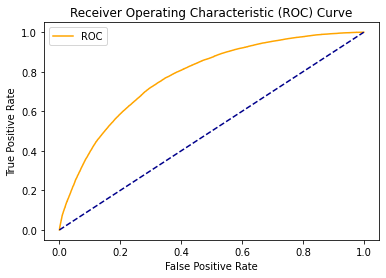

In [43]:
plot_roc_curve(fpr, tpr)

In [89]:
lr_parameters = {'l1_ratio':[1], 'C': [1]}
lr_grid = GridSearchCV(LR, lr_parameters, cv=10, refit='True', n_jobs=-1, verbose=1, scoring='roc_auc')
lr_model = lr_grid.best_estimator_

<IPython.core.display.Javascript object>

AttributeError: 'GridSearchCV' object has no attribute 'best_estimator_'

In [ ]:
results = results.append({'Model Type' : 'Logistic Regression',
                          'AUC - ' : lr_grid.best_score_,
                          'AUC - Valid' : roc_auc_score(y_test_, lr_model.predict_proba(X_test_)[:, 1]),
                          'Hyperparameters' : lr_grid.best_params_},
                        ignore_index=True)
results

#### Random_Forest

In [28]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(n_estimators=100)
rf_clf.fit(X_train_,y_train_)

RandomForestClassifier()

In [29]:
y_predict_rf=rf_clf.predict(X_test_)

In [30]:
pd.crosstab(y_test_, y_predict_rf)

col_0,0,1
row_0,,
0,137166,105
1,3577,134290


In [31]:
print(classification_report(y_test_,y_predict_rf))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99    137271
           1       1.00      0.97      0.99    137867

    accuracy                           0.99    275138
   macro avg       0.99      0.99      0.99    275138
weighted avg       0.99      0.99      0.99    275138



In [32]:
recall_rf=recall_score(y_test_,y_predict_rf)

In [33]:
print("The rercall score for RandomForest is: ",recall_rf)

The rercall score for RandomForest is:  0.9740547048967483


In [34]:
def predict_threshold (model,X_test_,thresholds):
    return np.where(model.predict_proba(X_test_)[:,1]>thresholds,1,0)#checking where probability of class 1 is  greater than threshold

In [35]:
def plot_roc_curve(fpr, tpr):# function to plot roc curve
    plt.plot(fpr, tpr, color='orange', label='ROC')#line plot between fpr and tpr
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')# assigning name to  x axis
    plt.ylabel('True Positive Rate')# assigning name to y axis
    plt.title('Receiver Operating Characteristic (ROC) Curve')#assigning name to curve  
    plt.legend()#area describing the elements of the graph
    plt.show()#to show graph without location

In [36]:
probs1=rf_clf.predict_proba(X_test_)[:,1]

In [37]:
import numpy as np
from sklearn.metrics import confusion_matrix
for thr in np.arange(0,1.0,0.1):# it will create matrix /array from range 0 to 1 with step 0.2
    y_predict = predict_threshold(rf_clf,X_test_,thr)# it will check result  for  each threshold from 0 to 0.2
    print("Threshold :",thr)#printing threshold
    print(confusion_matrix(y_test_,y_predict_rf))

Threshold : 0.0
[[137166    105]
 [  3577 134290]]
Threshold : 0.1
[[137166    105]
 [  3577 134290]]
Threshold : 0.2
[[137166    105]
 [  3577 134290]]
Threshold : 0.30000000000000004
[[137166    105]
 [  3577 134290]]
Threshold : 0.4
[[137166    105]
 [  3577 134290]]
Threshold : 0.5
[[137166    105]
 [  3577 134290]]
Threshold : 0.6000000000000001
[[137166    105]
 [  3577 134290]]
Threshold : 0.7000000000000001
[[137166    105]
 [  3577 134290]]
Threshold : 0.8
[[137166    105]
 [  3577 134290]]
Threshold : 0.9
[[137166    105]
 [  3577 134290]]


In [38]:
from sklearn.metrics import roc_auc_score,roc_curve ## used to compare multiple models
auc_ = roc_auc_score(y_test_, probs1) #roc curve 
print('AUC: %.2f' % auc_)

AUC: 1.00


In [39]:
fpr, tpr, thresholds = roc_curve(y_test_, probs1)

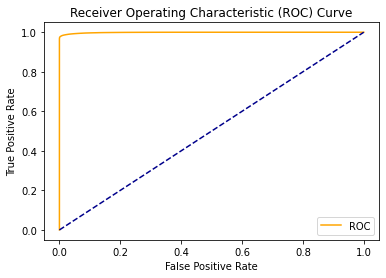

In [40]:
plot_roc_curve(fpr, tpr)

#### XGBoost

In [19]:
from xgboost import XGBClassifier

In [20]:
xgb=XGBClassifier(use_label_encoder=False)

In [21]:
xgb.fit(X_train_,y_train_)

[09:27:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=4,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

In [22]:
y_hat_xg=xgb.predict(X_test_)

In [23]:
pd.crosstab(y_test_, y_hat_xg)

col_0,0,1
row_0,,
0,133951,3607
1,10294,126966


In [24]:
print(classification_report(y_test_,y_hat_xg))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95    137558
           1       0.97      0.93      0.95    137260

    accuracy                           0.95    274818
   macro avg       0.95      0.95      0.95    274818
weighted avg       0.95      0.95      0.95    274818



In [25]:
accuracy_xgb=accuracy_score(y_test_,y_hat_xg)
recall_xgb=recall_score(y_test_,y_hat_xg)

In [26]:
print("The Recall Score of XGBoost is: ", recall_xgb)
print("The Accuracy Score of XGBoost is: ", accuracy_xgb)

The Recall Score of XGBoost is:  0.9250036427218418
The Accuracy Score of XGBoost is:  0.9494174326281394


In [27]:
def predict_threshold (model,X_test_,thresholds):
    return np.where(model.predict_proba(X_test_)[:,1]>thresholds,1,0)#checking where probability of class 1 is  greater than threshold

In [28]:
def plot_roc_curve(fpr, tpr):# function to plot roc curve
    plt.plot(fpr, tpr, color='orange', label='ROC')#line plot between fpr and tpr
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')# assigning name to  x axis
    plt.ylabel('True Positive Rate')# assigning name to y axis
    plt.title('Receiver Operating Characteristic (ROC) Curve')#assigning name to curve  
    plt.legend()#area describing the elements of the graph
    plt.show()#to show graph without location

In [30]:
probs2=xgb.predict_proba(X_test_)[:,1]

In [31]:
import numpy as np
from sklearn.metrics import confusion_matrix
for thr in np.arange(0,1.0,0.1):# it will create matrix /array from range 0 to 1 with step 0.2
    y_predict_xgb_c = predict_threshold(xgb,X_test_,thr)# it will check result  for  each threshold from 0 to 0.2
    print("Threshold :",thr)#printing threshold
    print(confusion_matrix(y_test_,y_hat_xg))

Threshold : 0.0
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.1
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.2
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.30000000000000004
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.4
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.5
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.6000000000000001
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.7000000000000001
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.8
[[133951   3607]
 [ 10294 126966]]
Threshold : 0.9
[[133951   3607]
 [ 10294 126966]]


In [32]:
from sklearn.metrics import roc_auc_score,roc_curve ## used to compare multiple models
auc_xgb = roc_auc_score(y_test_, probs2) #roc curve 
print('AUC: %.2f' % auc_xgb)

AUC: 0.98


In [33]:
fpr, tpr, thresholds = roc_curve(y_test_, probs2)

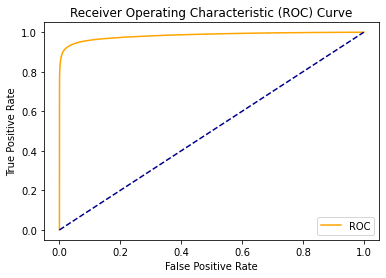

In [34]:
plot_roc_curve(fpr, tpr)

#### ANN

In [35]:
from sklearn.neural_network import MLPClassifier

In [36]:
ann_model = MLPClassifier( hidden_layer_sizes=(50,3), # 50 neurons in 3 hidden layers
                       learning_rate_init=0.1,
                       max_iter=100, # 1forward propagation, error calculation, back propagation for single record here 100 times. 455 rows 45500 iterations. 
                       random_state=2)

In [37]:
ann_model.fit(X_train_,y_train_)

MLPClassifier(hidden_layer_sizes=(50, 3), learning_rate_init=0.1, max_iter=100,
              random_state=2)

In [38]:
y_predict_proba_ann = ann_model.predict_proba(X_test_)

In [39]:
y_predict_ann_ = ann_model.predict(X_test_)

In [42]:
y_train_predict_ann = ann_model.predict(X_train_)

In [43]:
print("Train accuracy :",accuracy_score(y_train_,y_train_predict_ann))
print("Test accuracy :",accuracy_score(y_test_,y_predict_ann_))

Train accuracy : 0.4998192738934468
Test accuracy : 0.5005421770044175


In [44]:
pd.crosstab(y_test_,y_predict_ann_)

col_0,0
row_0,
0,137558
1,137260


In [45]:
print(classification_report(y_test_,y_predict_ann_))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67    137558
           1       0.00      0.00      0.00    137260

    accuracy                           0.50    274818
   macro avg       0.25      0.50      0.33    274818
weighted avg       0.25      0.50      0.33    274818



#### We can see the best score is obtained from the RandomForest of about 97.40%

## Deployment

In [57]:
## Pickling

#open a file to store data
home_loan=open("Random_Forest_HomeLoanDef.pkl", "wb") #wb for copy paste what we can't do in rb

#dump information to that file
pickle.dump(rf_clf,home_loan)

In [61]:
from sklearn.model_selection import validation_curve

In [ ]:
plt.subplots(1, figsize=(7,7))
plt.plot(X_train, label="Training score", color="black")
plt.plot(recall_rf, label="Cross-validation score", color="dimgrey")


 
plt.title("Validation Curve With Random Forest")
plt.xlabel("Number Of Trees")
plt.ylabel("Accuracy Score")
plt.tight_layout()
plt.legend(loc="best")
plt.show()